### Average speed map
Create a map of Camden with average speed attributed to each street segment. Average speed is taken from historical data.

* Import street network

In [1]:
import igraph as ig
tobys_dir = '../topic modelling/data/itn directed network from toby/'
camden_network = ig.load(tobys_dir + 'camden_buff100_routing.graphml')

In [2]:
from cPickle import load, dump
with open(tobys_dir + 'camden_buff100_node_positions.pkl','r') as infile:
    node_positions = load(infile)
with open(tobys_dir + 'camden_buff100_edge_polylines_kira.pkl','r') as infile:
    edge_polylines = load(infile)

* Import all journey data

In [3]:
import os  
speeds_per_segment = {} # store speeds per each segment
for fn in os.listdir('../topic modelling/data/police journeys'):
    with open('../topic modelling/data/police journeys/'+fn,'r') as infile:
        next(infile)
        for line in infile:
            words = line.rstrip().split(',')
            speed = float(words[12])
            fid = words[-2][1:-1]
            if fid in speeds_per_segment:
                speeds_per_segment[fid].append(speed)
            else:
                speeds_per_segment[fid] = [speed]    

* Calculate mean speed per segment

In [4]:
import numpy as np
segments = []
av_speeds = []
av_speed_per_segment = {}

for fid, speeds in speeds_per_segment.iteritems():
    segments.append(fid)
    av_speed = np.mean(speeds)
    av_speeds.append(av_speed)
    av_speed_per_segment[fid] = av_speed

* Visualise results

(array([ 110.,   60.,  122.,  184.,  252.,  326.,  411.,  423.,  420.,
         396.,  436.,  333.,  277.,  252.,  202.,  133.,  124.,   87.,
          61.,   45.,   34.,   13.,   12.,    5.,    5.,   10.,    5.,
           4.,    3.,    1.,    2.,    1.,    1.,    2.,    0.,    1.,
           0.,    1.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    1.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    1.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    1.]),
 array([   0.  ,    2.45,    4.9 ,    7.35,    9.8 ,   12.25,   14.7 ,
          17.15,   19.6 ,   22.05,   24.5 ,   26.95,   29.4 ,   31.85,
          34.3 ,   36.75,   39.2 ,   41.65,   44.1 ,   46.55,   49. 

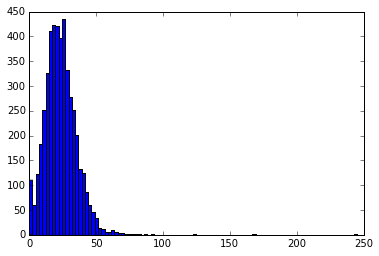

In [5]:
# Histogram of speeds
import matplotlib.pyplot as plt
%matplotlib inline

plt.hist(av_speeds,bins=100)

In [6]:
# Simple stats
print np.mean(av_speeds)
print np.std(av_speeds)

23.4741367789
12.1399589354


In [7]:
# Graph

# Add vertex position attribute
for i,vertex in enumerate(camden_network.vs):
    x,y = node_positions[vertex['id']]
    camden_network.vs[i]['x']=x
    camden_network.vs[i]['y']=-y
    
# Add average speed attribute
not_visited_count = 0
for i,edge in enumerate(camden_network.es):
    if edge['fid'] in av_speed_per_segment:
        av_speed = av_speed_per_segment[edge['fid']]
        camden_network.es[i]['speed']=av_speed
    else:
        not_visited_count += 1
        camden_network.es[i]['speed']=23.5    # if not visited in the past, assume that it could be traversed at an average speed

##### Mapping attempt one: using palettes

In [9]:
pal2 = ig.RainbowPalette(start=0, end=max(av_speeds))

In [10]:
pal = ig.GradientPalette("red", "blue", max(av_speeds)+1)

In [15]:
ig.plot(camden_network,vertex_size=1,edge_arrow_size=0,edge_color = ('blue','red',pal.get(['speed'])))

In [18]:
ig.plot(camden_network,vertex_size=1,edge_arrow_size=0,edge_color = ('blue','red', pal2.get(['speed'])))

In [20]:
ig.plot(camden_network,vertex_size=1,edge_arrow_size=0,edge_color = ('red', pal2.get(['speed'])))

##### Mapping attempt 2: using predefined color values

In [25]:
# Set speed thresholds for colours: yellow, red, blue
thres1 = np.mean(av_speeds) - np.std(av_speeds)
thres2 = np.mean(av_speeds) + np.std(av_speeds)

In [28]:
for edge in camden_network.es:
    if edge['speed']<=thres1:
       edge['color'] = 'yellow' # slow
    elif edge['speed']<=thres2: 
       edge['color'] = 'red'  # average
    else:
       edge['color'] = 'blue'  # fast

In [29]:
ig.plot(camden_network,vertex_size=1,edge_arrow_size=0)